# Maximize Unit Activation, remain close to input

We modify a randomly initialized input so that it maximizes the output of a particular final units (in our case, a class unit), while remaining close to either an original input from the dataset or to zero.

We will see that, for all classes:

* there seems to be a highly discriminative high frequency oscillation (~85 Hz)
* for "later" classes (corresponding to later phases within a trial), they seem to mostly use a high frequency oscillation long before the event -> likely using detection of an earlier event + offset(?)

Subject 1 does not seem to have this highly discriminative oscillation in the input data. Possibly, this is just something useful for other subjects, since the model was trained on all subjects. We can try to investigate that by making the constraint to the input stronger. We could also try to maximize a random input to match the activations of different layers for subject 1 inputs. 

In [2]:
import matplotlib
from matplotlib import pyplot as plt
from matplotlib import cm
%matplotlib inline
%config InlineBackend.figure_format = 'svg' 

import matplotlib.lines as mlines
import seaborn
seaborn.set_style('darkgrid')
matplotlib.rcParams['figure.figsize'] = (12.0, 1.0)
matplotlib.rcParams['font.size'] = 7
import theano.tensor as T
import lasagne
import logging
log = logging.getLogger()
log.setLevel("DEBUG")

def optimize_to_wanted_output(out_layer, in_shape, squared_diff_factor=1e-3):
    """Create Function to optimize a randomly generated input towards 
    a certain unit in the given output layer.
    Returns a random variable and an update function.
    Update function needs to get both the index of the unit to maximize in the layer
    and an input to remain close to (in terms of squared difference of random 
    variable and given input).
    Calling the update function changes the shared random variables value.
    squared_diff_factor weights how important it is to remain close to the given input."""
    rng = RandomState(983748374)
    orig_input = T.ftensor4()
    rand_input = rng.randn(*in_shape).astype(np.float32)
    rand_in_var = theano.shared(rand_input)

    output = lasagne.layers.get_output(out_layer, deterministic=True, inputs=rand_in_var)

    wanted_unit = T.iscalar()

    wanted_output = output[:,wanted_unit]
    squared_diff_to_orig = T.sum(T.sqr(orig_input - rand_in_var))
    cost = -T.mean(wanted_output) + squared_diff_to_orig * squared_diff_factor
    updates = lasagne.updates.adam(cost, [rand_in_var], learning_rate=0.1)

    update_fn = theano.function([wanted_unit, orig_input], cost, updates=updates)
    return rand_in_var, update_fn

Using gpu device 0: GeForce GTX 780 (CNMeM is disabled)


## Optimized for class 1 close to a class 1 input

First, we optimize the input to maximize class 1 and stay close to a class 1 input from subject 1. 

### Load model

We load a model which was trained only using serieswise preprocessing, so we can load individual subjects and don't have to load all subjects.

In [3]:
from braindecode.veganlasagne.layers import (get_n_sample_preds,
    get_input_shape, get_used_input_length, get_input_var,
    transform_to_normal_net, get_model_input_window)
from braindecode.datasets.grasp_lift import KaggleGraspLiftSet
import numpy as np

In [4]:
result = np.load('data/models/grasp-lift/all-sub/deeper/batch-norm/2.result.pkl')
model = np.load('data/models/grasp-lift/all-sub/deeper/batch-norm/2.pkl')
normal_net = transform_to_normal_net(model)
assert get_used_input_length(normal_net) == get_input_shape(normal_net)[2] == get_model_input_window(model)

### Create prediction function

In [5]:
import theano
all_layers = lasagne.layers.get_all_layers(normal_net)
preds = lasagne.layers.get_output(all_layers[29], deterministic=True)
pred_fn = theano.function([get_input_var(normal_net)], preds)

### Load Set

In [6]:
from braindecode.datasets.grasp_lift import KaggleGraspLiftSet
kaggle_set = KaggleGraspLiftSet(data_folder='data/kaggle-grasp-lift/', i_subject=1,
                  resample_half=False, standardize=True)

In [7]:
kaggle_set.load()

INFO:braindecode.datasets.grasp_lift:Loading data...
INFO:braindecode.datasets.grasp_lift:Standardizing data...
INFO:braindecode.datasets.grasp_lift:..Done.


### Determine trial for class 1

In [24]:
# search for a label for first class, 52500 is quite randomly chosen :))
i_class = 0
train_y = kaggle_set.train_y_series[0]

class_inds = np.flatnonzero(train_y[1:,i_class] - train_y[:-1,i_class] == 1) + 75 + 1
i_sample = class_inds[4]

In [25]:
# everything fine, only class 1 selected
kaggle_set.train_y_series[0][i_sample]

array([1, 0, 0, 0, 0, 0], dtype=int32)

In [26]:
inputs = kaggle_set.train_X_series[0][i_sample - get_used_input_length(normal_net): i_sample]
inputs = inputs.T[np.newaxis, :,:,np.newaxis]

### Check Predictions

In [27]:
pred_fn(inputs) # seems fine, class 1 highly predicted

array([[  3.70196795,  -6.88597202,  -8.89417744, -10.32002735,
         -8.28535366,  -9.25916767]], dtype=float32)

### Create Update function

In [28]:
from numpy.random import RandomState
in_shape = [1] + list(get_input_shape(normal_net)[1:])
rand_var, update_fn = optimize_to_wanted_output(normal_net.input_layer, 
                                                in_shape, squared_diff_factor=0.001)

## Do the update

In [29]:
for i in range(500):
    cost = update_fn(0, inputs)
    if i % 100 == 0: 
        print cost

239.600662231
-41.285533905
-42.1453399658
-42.1289978027
-42.0943603516


## Show subsampled input

Naively subsampled by factor 10... just to get an impression.

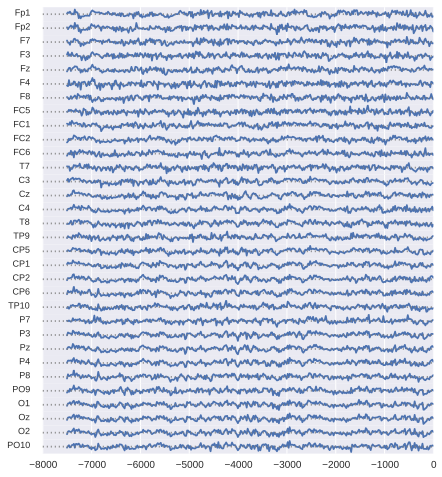

In [30]:
from braindecode.analysis.plot_util import plot_sensor_signals
plot_sensor_signals(inputs.squeeze()[:,::10], kaggle_set.sensor_names,
                   xvals=range(-3752*2,0,20))

None

### Optimized input

We see there is something happening at the end of the input mostly

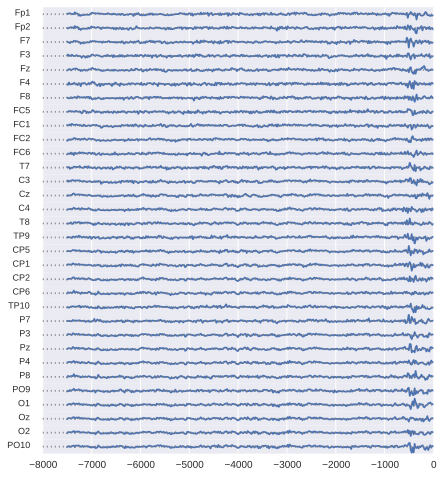

In [31]:
from braindecode.analysis.plot_util import plot_sensor_signals
plot_sensor_signals(rand_var.get_value().squeeze()[:,::10],
                    kaggle_set.sensor_names,
                   xvals=range(-3752*2,0,20))

None

### Optimized input minus original input

We see almost all the change happens in the last part of signal.

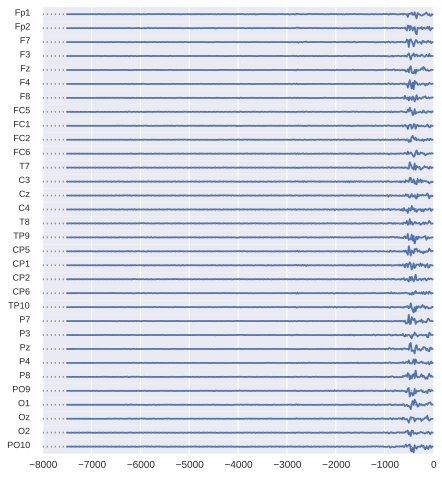

In [32]:
from braindecode.analysis.plot_util import plot_sensor_signals
plot_sensor_signals(rand_var.get_value().squeeze()[:,::10] - inputs.squeeze()[:,::10], 
                    kaggle_set.sensor_names, xvals=range(-3752*2,0,20))

None

### Last part, with optimized input and original input 

We see some clear pattern  starting about 550 ms before the hand start event. 
Green is original input, blue is optimized input.

In [33]:
combined = np.array([rand_var.get_value().squeeze(), inputs.squeeze()]).transpose(1,2,0)

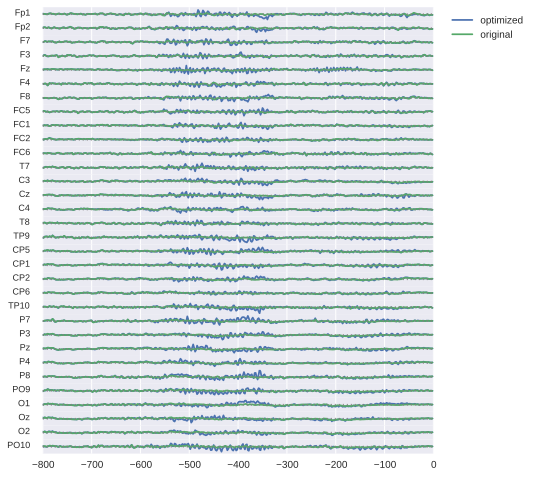

In [34]:
fig = plot_sensor_signals(combined[:,-400:], kaggle_set.sensor_names,
                   xvals=range(-800,0,2))
fig.axes[0].legend(("optimized", "original"), bbox_to_anchor=(1.25, 1.), loc='upper right')
None

## Fourier transform of relevant part

Amplitudes averaged across all sensors for time from -700ms to -300ms.

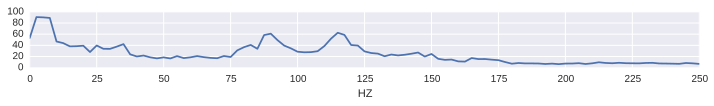

In [35]:
from braindecode.analysis.util import amplitudes_and_freqs
bps, freqs = amplitudes_and_freqs(rand_var.get_value().squeeze()[:,-350:-150], sampling_rate=500.0)
plt.plot(freqs, np.mean(bps,axis=0))
plt.xticks(range(0,251,25))
plt.xlabel('HZ')
None

## Topographies

Now we are just showing the signal from -700 to -300

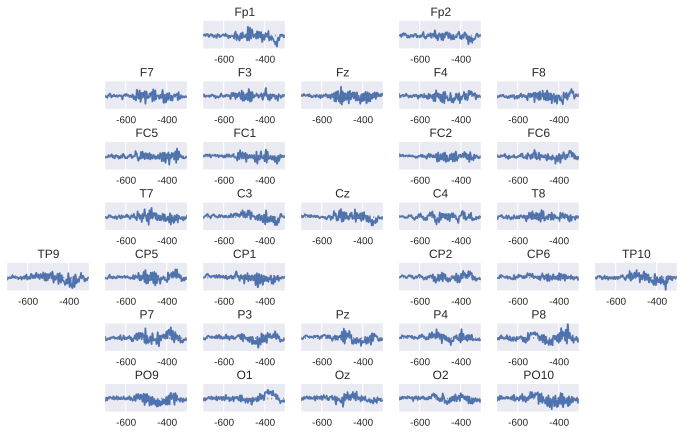

In [36]:
from braindecode.analysis.plot_util import plot_head_signals_tight
from braindecode.datasets.sensor_positions import tight_Kaggle_positions
plot_head_signals_tight(rand_var.get_value().squeeze()[:,-350:-150], kaggle_set.sensor_names, 
                       sensor_map=tight_Kaggle_positions)
plt.xticks(range(50,151,100), range(-600,-399,200))
plt.subplots_adjust(hspace=1.2)
None

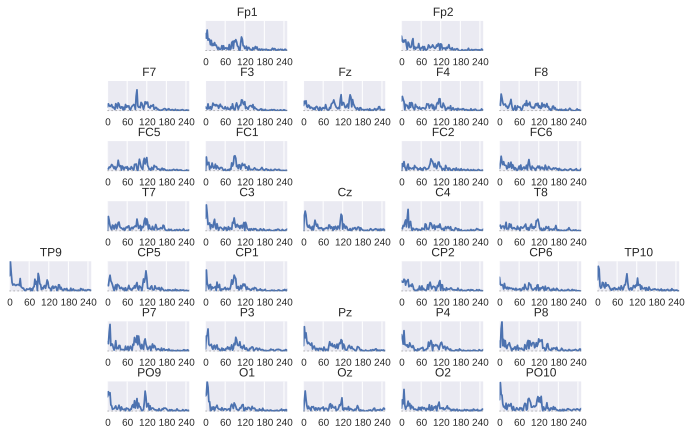

In [37]:

fig = plot_head_signals_tight(bps, kaggle_set.sensor_names, 
                       sensor_map=tight_Kaggle_positions)
plt.xticks(range(bps.shape[1])[::24], [int(f) for f in freqs[::24]])
plt.subplots_adjust(hspace=1.0)
None

## All Classes, Constraint close to zero

In [38]:
from numpy.random import RandomState
from copy import deepcopy

optimized_vars = []
in_shape = [1] + list(get_input_shape(normal_net)[1:])

rand_var, update_fn = optimize_to_wanted_output(normal_net.input_layer, 
                                                    in_shape, squared_diff_factor=0.001)
orig_rand_val = deepcopy(rand_var.get_value())
for i_class in range(6):
    print("Running for class {:d}".format(i_class + 1))
    rand_var.set_value(orig_rand_val)
    for i in range(500):
        cost = update_fn(i_class, np.zeros(inputs.shape, dtype=np.float32))
        if i % 100 == 0: 
            print "cost", cost
    optimized_vars.append(deepcopy(rand_var.get_value().squeeze()))
    print "final preds for class: " + str(i_class + 1)
    print pred_fn(rand_var.get_value()).squeeze()

Running for class 1
cost 120.057250977
cost -41.0970916748
cost -43.6432533264
cost -43.8136367798
cost -43.8586654663
final preds for class: 1
[  88.33490753 -139.57824707 -192.73252869 -184.30725098  -98.31311798
 -117.44623566]
Running for class 2
cost 122.952697754
cost -66.4032440186
cost -68.0023040771
cost -71.4525146484
cost -73.3430633545
final preds for class: 2
[-151.54396057  152.57377625   20.99937057 -656.29400635 -934.58679199
 -458.46279907]
Running for class 3
cost 123.166465759
cost -20.1754245758
cost -23.0472202301
cost -23.4210548401
cost -24.1652488708
final preds for class: 3
[-174.14599609   47.72655106   47.62638855   15.77602863 -227.42196655
 -200.05979919]
Running for class 4
cost 123.544563293
cost -26.9923725128
cost -27.8676071167
cost -27.9148483276
cost -28.0612602234
final preds for class: 4
[-239.46678162 -108.8455658   -36.15357971   58.44943619 -258.59402466
 -267.00393677]
Running for class 5
cost 122.926986694
cost -25.3006362915
cost -26.08979034

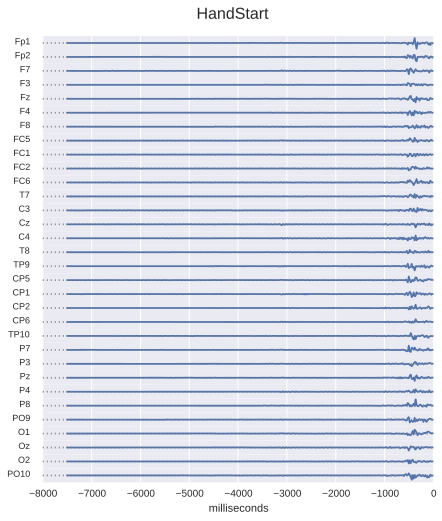

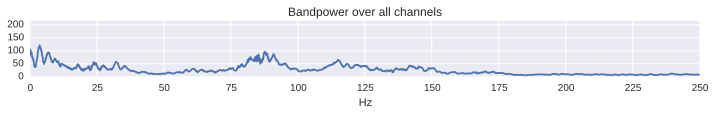

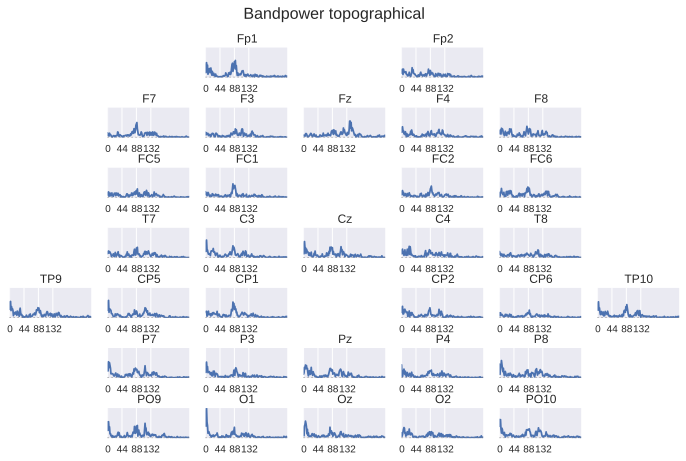

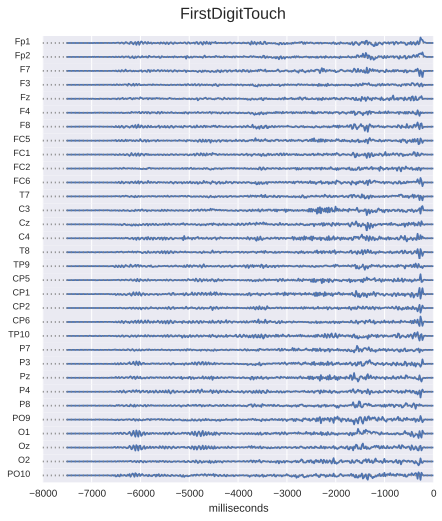

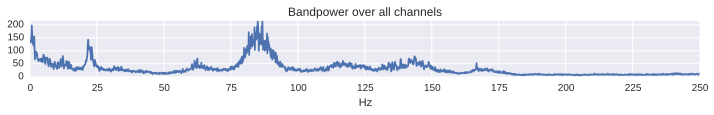

...

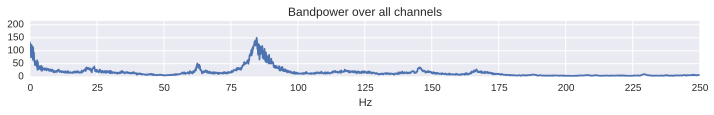

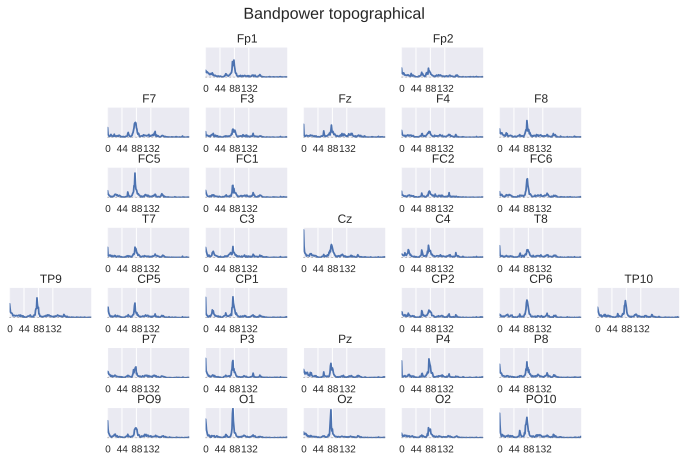

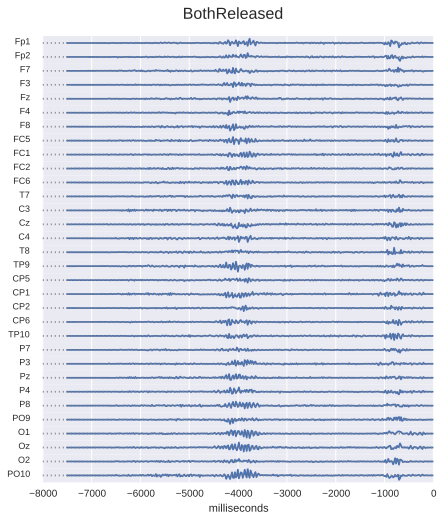

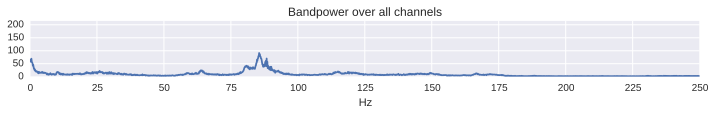

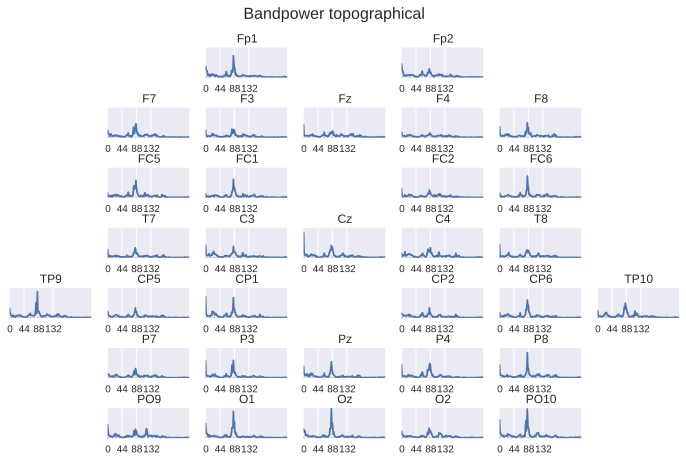

In [97]:
class_names = ['HandStart', 'FirstDigitTouch', 'BothStartLoadPhase',
    'LiftOff', 'Replace', 'BothReleased']
def smooth_subsample_2nd_axis(inputs, factor):
    assert factor % 2 == 1, "Factor should be odd to ensure any sample is the center of its convolution"
    assert inputs.ndim == 2
    smoothed = [np.convolve(arr, np.ones(factor) / float(factor), mode='same') for arr in inputs]
    subsampled = np.array(smoothed)[:,factor //2 ::factor]
    return subsampled

None
for i_class in range(6):
    fig = plot_sensor_signals(optimized_vars[i_class][:,::10], 
        kaggle_set.sensor_names, xvals=range(-3752*2,0,2 * 10))
    fig.suptitle(class_names[i_class], fontsize=16, y=0.95)
    plt.xlabel('milliseconds')
    bps, freqs = amplitudes_and_freqs(optimized_vars[i_class], sampling_rate=500.0)
    plt.figure()
    plt.title("Bandpower over all channels")
    plt.plot(freqs, np.mean(bps,axis=0))
    plt.xticks(range(0,251,25))
    plt.ylim(0,215)
    plt.xlabel('Hz')
    
    subsampled_bps = smooth_subsample_2nd_axis(bps, factor=11)
    subsampled_freqs = smooth_subsample_2nd_axis(np.atleast_2d(freqs), factor=11)[0]

    fig = plot_head_signals_tight(subsampled_bps, kaggle_set.sensor_names, 
                           sensor_map=tight_Kaggle_positions)
    plt.xticks(range(subsampled_bps.shape[1])[:91:30], [int(f) for f in subsampled_freqs[:91:30]])
    plt.subplots_adjust(hspace=1.0)
    fig.suptitle('Bandpower topographical', fontsize=16, y=0.98)
None


## Single trial visibility

These frequencies do not show up on single trial visualizations. We show the fft decomposition of the input window for a random event per class.

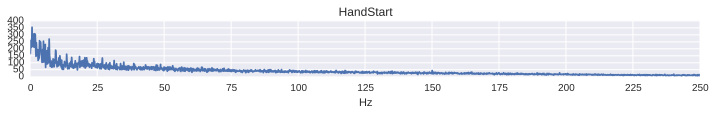

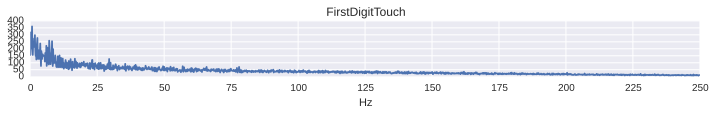

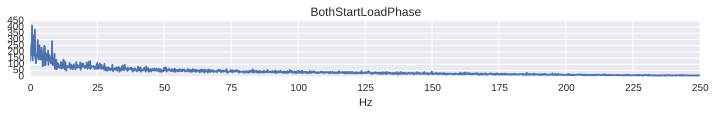

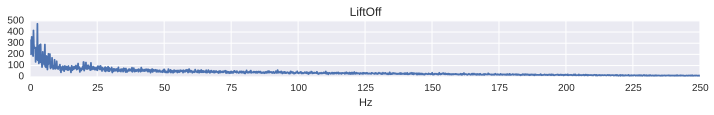

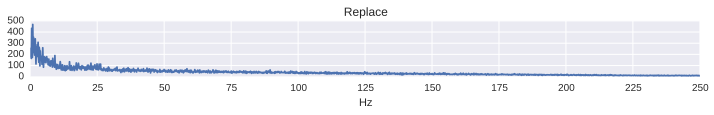

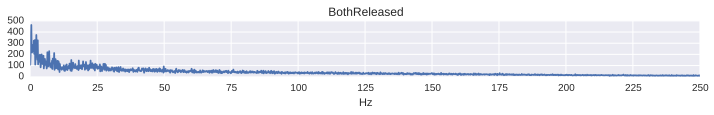

In [66]:

sample_rng = RandomState(59837483)
for i_class in range(6):
    class_inds = np.flatnonzero(train_y[1:,i_class] - train_y[:-1,i_class] == 1) + 75 + 1
    i_sample = sample_rng.choice(class_inds[1:])
    inputs = kaggle_set.train_X_series[0][i_sample - get_used_input_length(normal_net): i_sample]
    bps, freqs = amplitudes_and_freqs(inputs.T, sampling_rate=500.0)
    
    plt.figure()
    plt.title(class_names[i_class])
    plt.plot(freqs, np.mean(bps,axis=0))
    plt.xticks(range(0,251,25))
    plt.xlabel('Hz')

## One second before all events

Now we show the bandpower for one second before all events of a certain class. Also we don't see any high frequency peak.

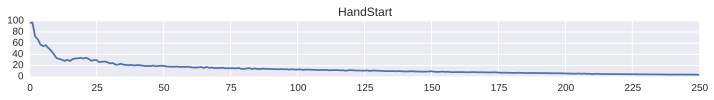

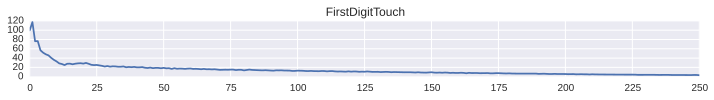

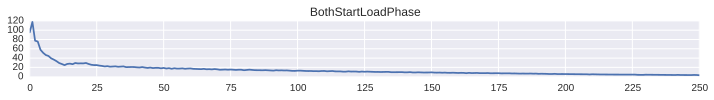

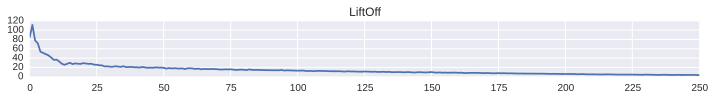

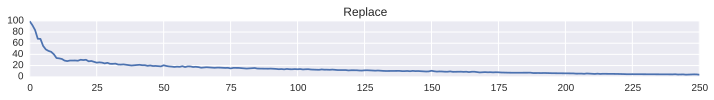

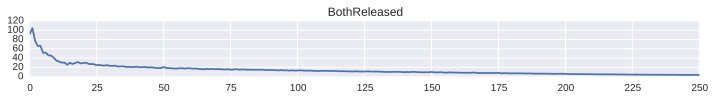

In [65]:
train_y = kaggle_set.train_y_series[0]
train_X = kaggle_set.train_X_series[0]
for i_class in range(6):
    class_inds = np.flatnonzero(train_y[1:,i_class] - train_y[:-1,i_class] == 1) + 75 + 1
    all_class_trials = [train_X[i - 500:i] for i in class_inds[1:]]
    bps, freqs = amplitudes_and_freqs(np.array(all_class_trials), sampling_rate=500.0)

    plt.figure()
    plt.plot(freqs, np.mean(bps, axis=(0,2)))
    plt.title(class_names[i_class])
    plt.xticks(range(0,251,25))
    plt.xlabel('Hz')

## Find out time of supposed ~80-Hz signal

Now we try to use our optimized signal to tell us in which time before each event we should expect the high frequency oscillation.

1. We bandpass all the optimized signals to 50-100Hz
2. We square and smooth them to get something like a bandpower over the whole trial
3. We find timeblocks in the signal that are above the man
4. We determine the timeblock with the highest squared sum

For each class we then have a timeblock where we would expect the high frequency oscillation according to our optimized signals.


In [70]:
import scipy.signal
filt_order = 4
nyq_freq = 0.5 * 500.0
low_cut_hz = 75
high_cut_hz = 100
low = low_cut_hz / nyq_freq
high = high_cut_hz / nyq_freq
b, a = scipy.signal.butter(filt_order, [low, high], btype='band')
optimized_vars_bandpassed = scipy.signal.filtfilt(b,a,optimized_vars, axis=-1)


To ensure correctness, we show the different steps, blue is the squared signal, green the smoothesd signal, red are all timeblocks, and violet is the selected timeblock.

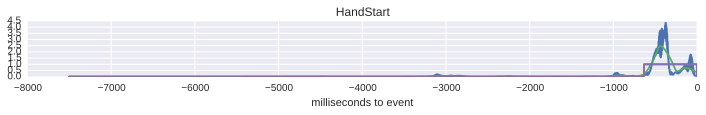

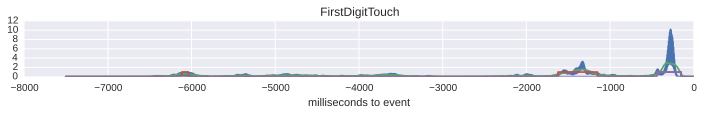

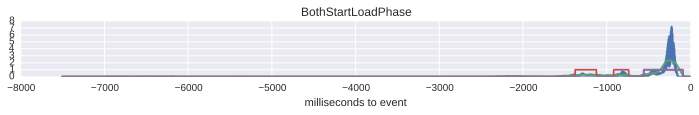

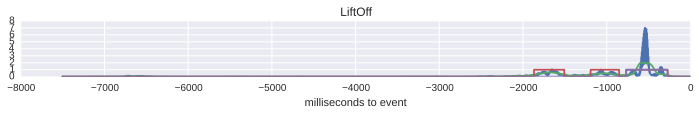

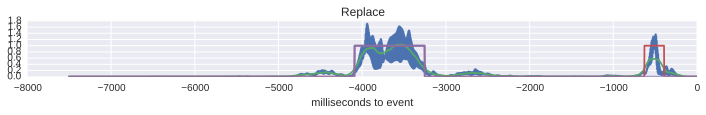

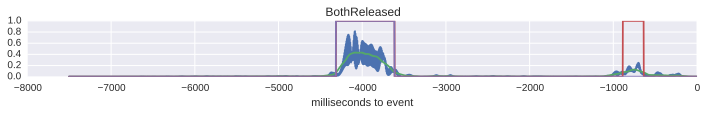

In [83]:
optimized_squared =  np.square(optimized_vars_bandpassed)
all_start_stops = []
for i_class in range(6):
    class_signal = np.mean(optimized_squared[i_class], axis=0)
    smoothed_class_signal = np.convolve(class_signal, [1/100.0] * 100, mode='same')
    important_parts = smoothed_class_signal > np.mean(smoothed_class_signal) * 2
    plt.figure()
    plt.title(class_names[i_class])
    xvals = range(-3752*2,0,2)
    plt.plot(xvals, class_signal)
    plt.plot(xvals, smoothed_class_signal)
    plt.plot(xvals, important_parts)
    important_parts = important_parts.astype(np.int32)
    # if one of the blocks would end at the end of the signal, have to add a False
    # so that the rest of the code (boundary determination) works
    if important_parts[-1] == True:
        important_parts = np.append(important_parts, False)
    boundaries = np.flatnonzero((important_parts[1:] -important_parts[:-1]))
    block_sums = [np.sum(class_signal[boundaries[2*i]:boundaries[2*i+1]]) for i in xrange(len(boundaries) // 2)]
    largest_block = np.argmax(block_sums)
    start_stop = boundaries[2*largest_block:2*largest_block+2]
    selected_block_signal = np.zeros(class_signal.shape)
    selected_block_signal[start_stop[0]:start_stop[1]] = 1
    plt.plot(xvals, selected_block_signal)
    plt.xlabel('milliseconds to event')
    all_start_stops.append(start_stop)

### Bandpower transformation

Now, for all events, we use these timeblocks to make another bandpower computation, however we cannot see anything again.

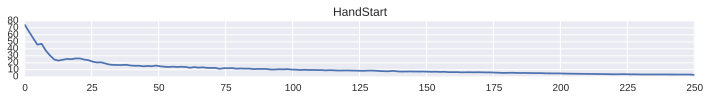

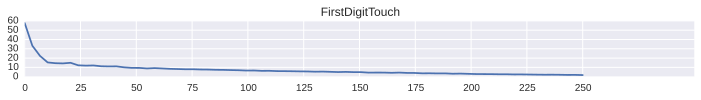

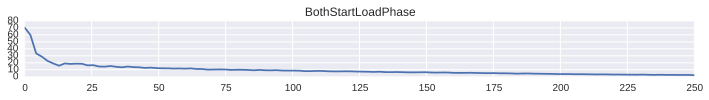

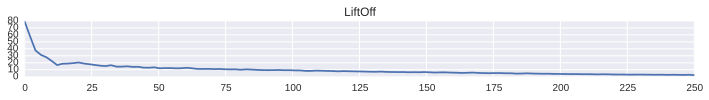

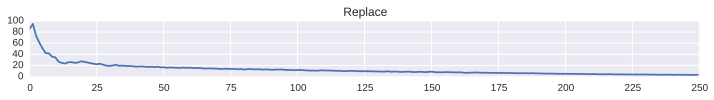

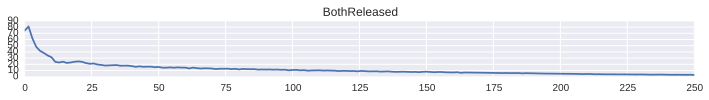

In [75]:
for i_class in range(6):
    class_inds = np.flatnonzero(train_y[1:,i_class] - train_y[:-1,i_class] == 1) + 75 + 1
    start_offset = 3752 - all_start_stops[i_class][0]
    stop_offset = 3752 - all_start_stops[i_class][1]
    all_class_trials = [train_X[i - start_offset:i-stop_offset] for i in class_inds[1:]]
    bps, freqs = amplitudes_and_freqs(np.array(all_class_trials), sampling_rate=500.0)

    plt.figure()
    plt.plot(freqs, np.mean(bps, axis=(0,2)))
    plt.title(class_names[i_class])
    plt.xticks(range(0,251,25))

### Reconstructing time structure

We can also use the means of the reconstructed blocks to reconstruct the time structure. This allows to check if the network is really using the timestructure of the events for this signal.
For this we always take the differences of the blockmeans of two consecutive classes.
We start with event 0 at time zero and then plot where according to these differences the next event should have been.
To compare to the actual timestructure, we also compute the mean diffs between consecutive classes over all trials.

In [146]:
train_y = kaggle_set.train_y_series[0]
diff_classes = []
for i_class in range(5):
    class_inds = np.flatnonzero(train_y[1:,i_class] - train_y[:-1,i_class] == 1) + 75 + 1
    next_class_inds = np.flatnonzero(train_y[1:,i_class+1] - train_y[:-1,i_class+1] == 1) + 75 + 1
    diffs = next_class_inds - class_inds
    diff_classes.append(diffs)

In [147]:
means_stds = [(np.mean(diffs), np.std(diffs)) for diffs in diff_classes]

In [183]:
real_time_structure = np.cumsum(np.array(means_stds)[:,0])

In [184]:
block_means = np.mean(all_start_stops, axis=1)
block_diffs = -np.diff(block_means)

In [185]:
reconstructed_time_structure = np.cumsum(block_diffs)

We see that there is a problem with the first diff between class 1 and 2, it is actually negative, whereas inreality it is about 300 ms (0 to blue line).

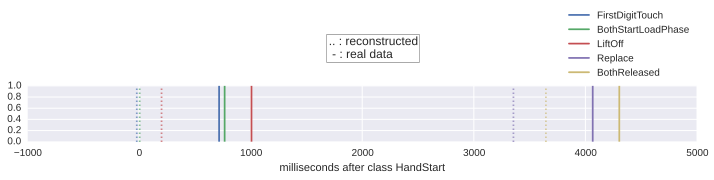

In [186]:
plt.figure()
i_class_offset = 0

for i_class in range(5-i_class_offset):
    i_plt_class = i_class+i_class_offset
    plt.axvline(x=real_time_structure[i_class] * 2, color=seaborn.color_palette()[i_plt_class],
               linestyle="-")
for i_class in range(5-i_class_offset):
    i_plt_class = i_class+i_class_offset
    plt.axvline(x=reconstructed_time_structure[i_class] * 2, color=seaborn.color_palette()[i_plt_class],
               linestyle=":")
plt.xlabel("milliseconds after class {:s}".format(class_names[i_class_offset]))
plt.text(0.45,1.5,".. : reconstructed\n - : real data", fontsize=12, horizontalalignment='left',
         bbox=dict(facecolor='None', edgecolor="black"), transform=plt.gca().transAxes)
plt.legend(class_names[i_class_offset+1:], bbox_to_anchor=(1,2.5))
None

If we ignore class 1 to class 2 and use class 2 as our reference start, we get a fairly close match.

In [120]:
real_time_structure = np.cumsum(np.array(means_stds)[1:,0])
reconstructed_time_structure = np.cumsum(block_diffs[1:])


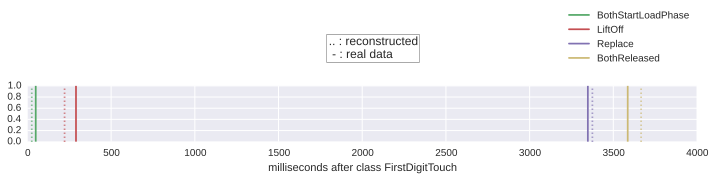

In [182]:

i_class_offset = 1

plt.figure()
real_time_structure = np.cumsum(np.array(means_stds)[i_class_offset:,0])
reconstructed_time_structure = np.cumsum(block_diffs[i_class_offset:])

for i_class in range(5-i_class_offset):
    i_plt_class = i_class+i_class_offset
    plt.axvline(x=real_time_structure[i_class] * 2, color=seaborn.color_palette()[i_plt_class],
               linestyle="-")
for i_class in range(5-i_class_offset):
    i_plt_class = i_class+i_class_offset
    plt.axvline(x=reconstructed_time_structure[i_class] * 2, color=seaborn.color_palette()[i_plt_class],
               linestyle=":")
plt.xlabel("milliseconds after class {:s}".format(class_names[i_class_offset]))
plt.text(0.45,1.5,".. : reconstructed\n - : real data", fontsize=12, horizontalalignment='left',
         bbox=dict(facecolor='None', edgecolor="black"), transform=plt.gca().transAxes)
plt.legend(class_names[i_class_offset+1:], bbox_to_anchor=(1,2.5))
None

## Estimating trial timestructure from all subjects

Since the model was trained on all subjects, it also makes sense to estimate the trial timestructure from all subjects.

In [129]:
from pylearn2.config import yaml_parse
train_dict = yaml_parse.load(open('data/models/grasp-lift/all-sub/deeper/batch-norm/2.yaml', 'r'))
dataset = train_dict['dataset']

dataset.load()
splitter = train_dict['dataset_splitter']
train_valid_test_sets = splitter.split_into_train_valid_test(dataset)

INFO:braindecode.datasets.grasp_lift:Loading Subject 1...
INFO:braindecode.datasets.grasp_lift:Loading data...
INFO:braindecode.datasets.grasp_lift:Standardizing data...
INFO:braindecode.datasets.grasp_lift:..Done.
INFO:braindecode.datasets.grasp_lift:Loading Subject 2...
INFO:braindecode.datasets.grasp_lift:Loading data...
INFO:braindecode.datasets.grasp_lift:Standardizing data...
INFO:braindecode.datasets.grasp_lift:..Done.
INFO:braindecode.datasets.grasp_lift:Loading Subject 3...
INFO:braindecode.datasets.grasp_lift:Loading data...
INFO:braindecode.datasets.grasp_lift:Standardizing data...
INFO:braindecode.datasets.grasp_lift:..Done.
INFO:braindecode.datasets.grasp_lift:Loading Subject 4...
INFO:braindecode.datasets.grasp_lift:Loading data...
INFO:braindecode.datasets.grasp_lift:Standardizing data...
INFO:braindecode.datasets.grasp_lift:..Done.
INFO:braindecode.datasets.grasp_lift:Loading Subject 5...
INFO:braindecode.datasets.grasp_lift:Loading data...
INFO:braindecode.datasets.gra

We see the time structure is somewhat reconstructed after the first class, the alignment is not perfect... Keep in mind, the task is to predict a window of 150 ms (+- 75ms) around each event.

In [187]:
train_y = train_valid_test_sets['train'].y

In [188]:
diff_classes = []
for i_class in range(5):
    class_inds = np.flatnonzero(train_y[1:,i_class] - train_y[:-1,i_class] == 1) + 75 + 1
    next_class_inds = np.flatnonzero(train_y[1:,i_class+1] - train_y[:-1,i_class+1] == 1) + 75 + 1
    diffs = next_class_inds - class_inds
    diff_classes.append(diffs)


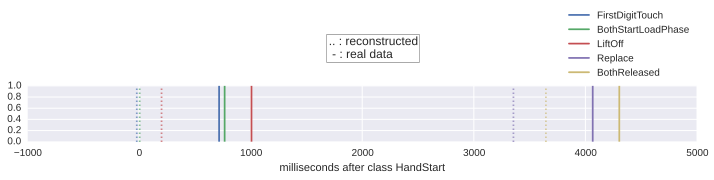

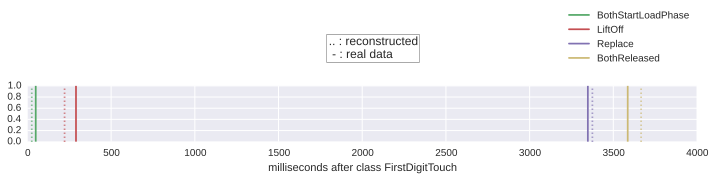

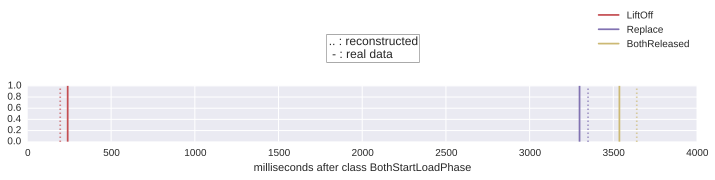

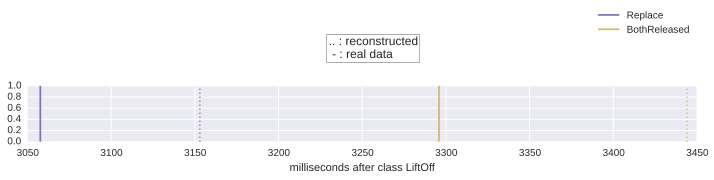

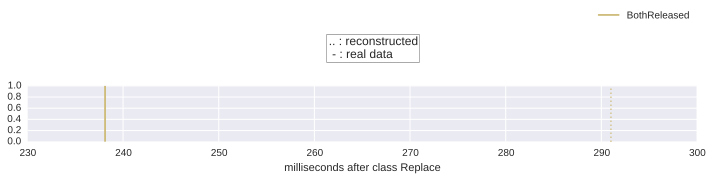

In [189]:
for i_class_offset in xrange(0,5):

    plt.figure()
    real_time_structure = np.cumsum(np.array(means_stds)[i_class_offset:,0])
    reconstructed_time_structure = np.cumsum(block_diffs[i_class_offset:])

    for i_class in range(5-i_class_offset):
        i_plt_class = i_class+i_class_offset
        plt.axvline(x=real_time_structure[i_class] * 2, color=seaborn.color_palette()[i_plt_class],
                   linestyle="-")
    for i_class in range(5-i_class_offset):
        i_plt_class = i_class+i_class_offset
        plt.axvline(x=reconstructed_time_structure[i_class] * 2, color=seaborn.color_palette()[i_plt_class],
                   linestyle=":")
    plt.xlabel("milliseconds after class {:s}".format(class_names[i_class_offset]))
    plt.text(0.45,1.5,".. : reconstructed\n - : real data", fontsize=12, horizontalalignment='left',
             bbox=dict(facecolor='None', edgecolor="black"), transform=plt.gca().transAxes)
    plt.legend(class_names[i_class_offset+1:], bbox_to_anchor=(1,2.5))
    None

## Fourier transformation across all subjects

Nothing again :(

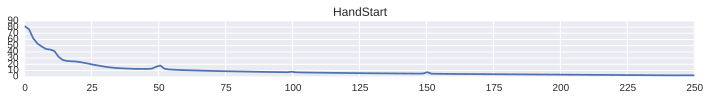

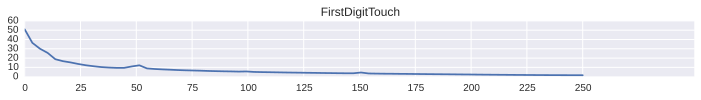

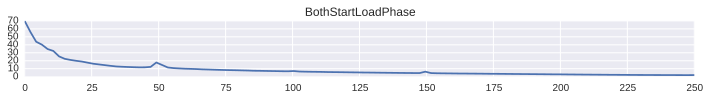

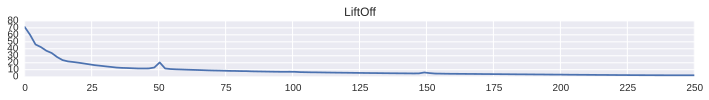

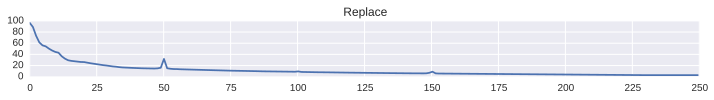

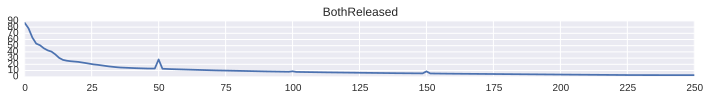

In [222]:
train_y = train_valid_test_sets['train'].y
train_X = train_valid_test_sets['train'].get_topological_view().squeeze()
for i_class in range(6):
    class_inds = np.flatnonzero(train_y[1:,i_class] - train_y[:-1,i_class] == 1) + 75 + 1
    assert np.all(train_y[class_inds, i_class] == 1)
    assert np.all(train_y[class_inds-75, i_class] == 1)
    assert np.all(train_y[class_inds+74, i_class] == 1)
    start_offset = 3752 - all_start_stops[i_class][0]
    stop_offset = 3752 - all_start_stops[i_class][1]
    all_class_trials = [train_X[i - start_offset:i-stop_offset] for i in class_inds[1:]]
    bps, freqs = amplitudes_and_freqs(np.array(all_class_trials), sampling_rate=500.0)

    plt.figure()
    plt.plot(freqs, np.mean(bps, axis=(0,2)))
    plt.title(class_names[i_class])
    plt.xticks(range(0,251,25))

## Fourier transformation of complete data

We see same 50 Hz peak, probably electrical noise I guess?:)

In [209]:
%%time
bps, freqs = amplitudes_and_freqs(train_X[0:10000000].T, sampling_rate=500.0)

CPU times: user 11.7 s, sys: 488 ms, total: 12.2 s
Wall time: 12.2 s


In [213]:
mean_bp = np.mean(bps, axis=0)

In [214]:
smoothed_bp = np.convolve(mean_bp, [1] * 1000, mode='same')

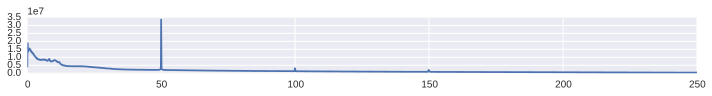

In [215]:
plt.plot(freqs[::1000], smoothed_bp[::1000])

In [1]:
%%capture
import os
import site
site.addsitedir('/home/schirrmr/.local/lib/python2.7/site-packages/')
site.addsitedir('/usr/lib/pymodules/python2.7/')
os.sys.path.insert(0, '/home/schirrmr/braindecode/code/')
%cd /home/schirrmr/braindecode/code/braindecode/
assert 'THEANO_FLAGS' in os.environ
# switch to cpu
#os.environ['THEANO_FLAGS'] = 'floatX=float32,device=cpu,nvcc.fastmath=True'
%load_ext autoreload
%autoreload 2